In [1]:
import dlib
from skimage import io
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import re
from PIL import Image
def convertToRGB(img): 
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [2]:
imagepath = './1_kwanghwamun_1213/all/'
savepath="/output/1"


# get_frontal_face_detector

In [3]:
detector = dlib.get_frontal_face_detector()

In [4]:
len(os.listdir(imagepath))

73

nothing


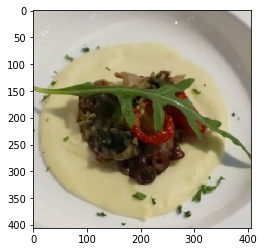

nothing


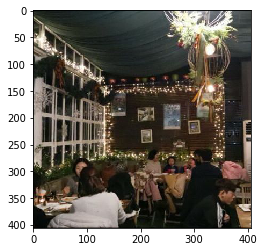

nothing


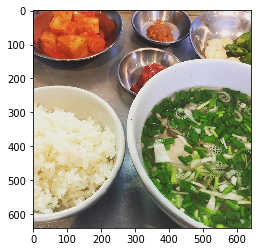

nothing


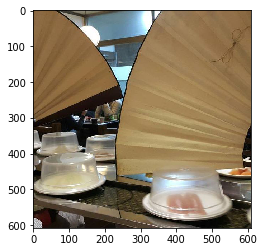

nothing


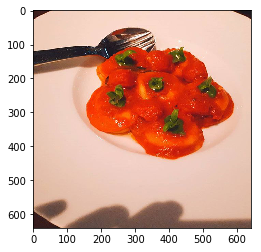

nothing


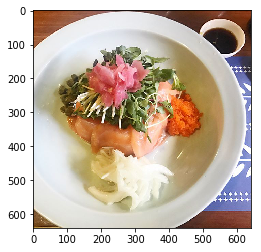

nothing


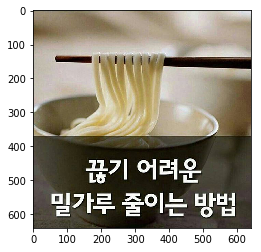

nothing


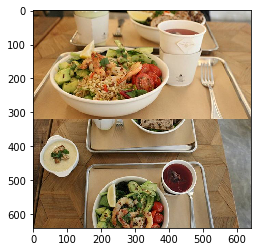

nothing


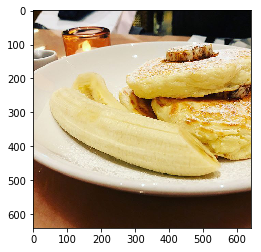

nothing


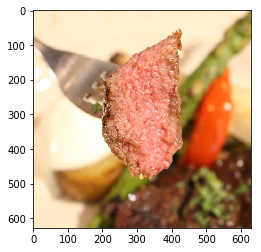

nothing


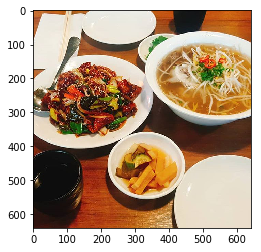

nothing


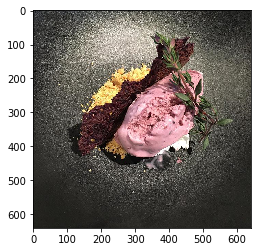

nothing


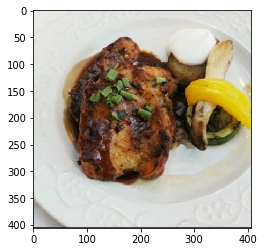

nothing


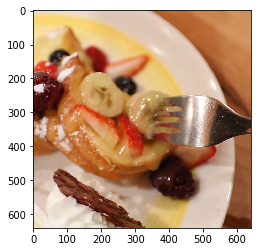

nothing


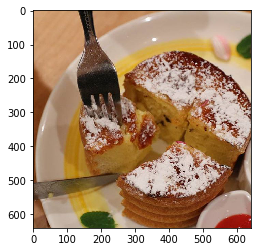

nothing


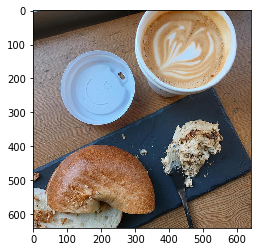

nothing


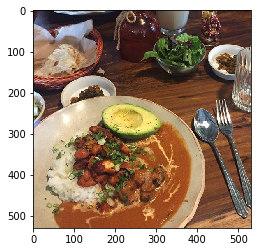

nothing


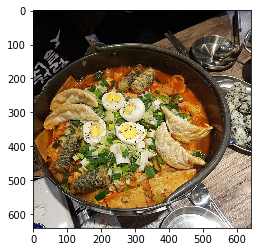

nothing


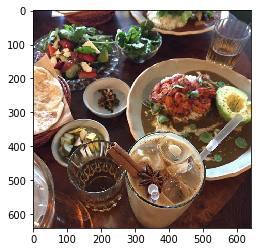

nothing


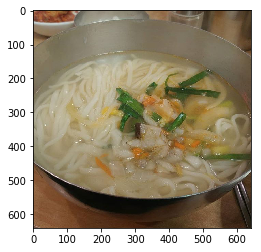

nothing


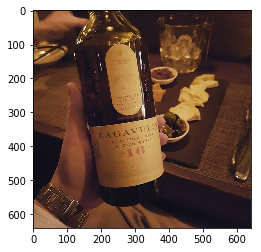

nothing


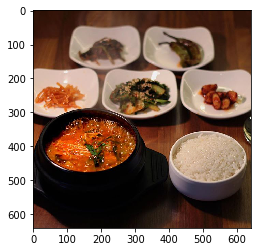

nothing


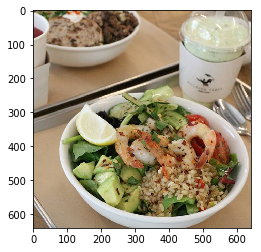

nothing


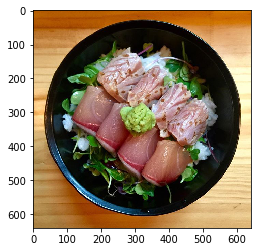

nothing


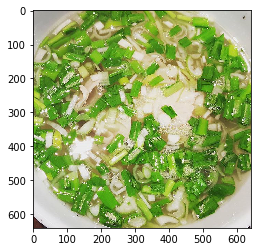

nothing


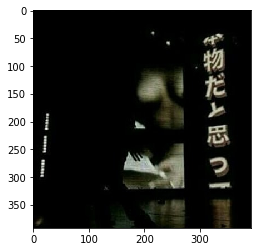

nothing


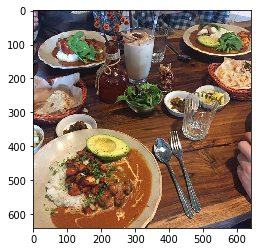

nothing


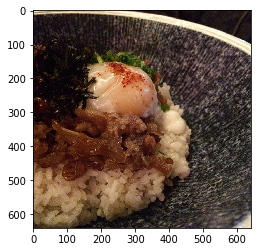

nothing


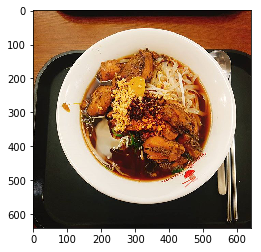

nothing


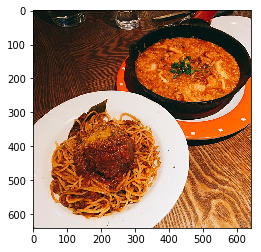

nothing


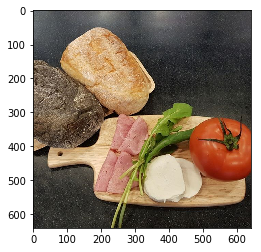

nothing


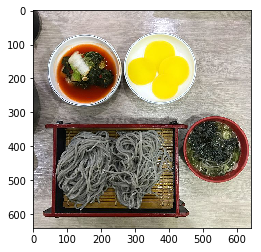

nothing


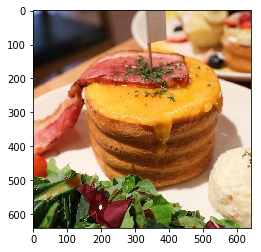

nothing


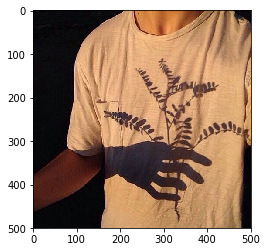

nothing


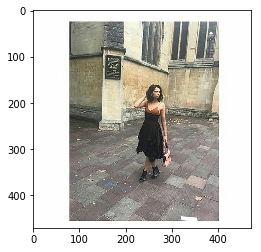

left,top,right,bottom: 165 222 423 480


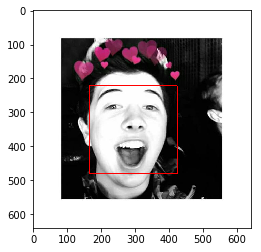

nothing


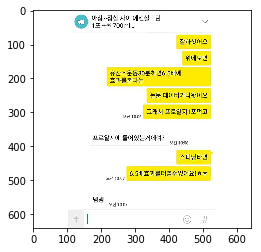

nothing


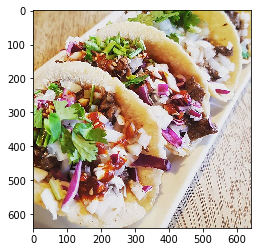

nothing


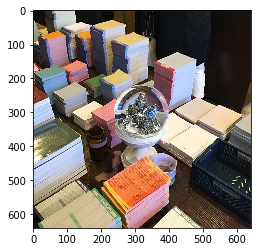

nothing


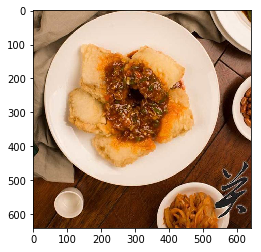

nothing


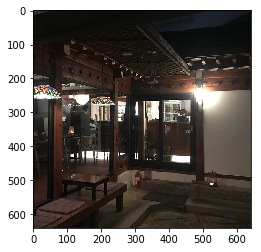

nothing


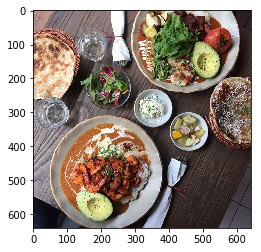

nothing


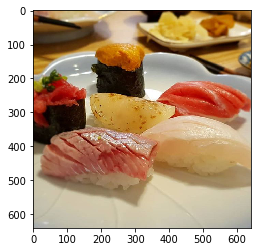

nothing


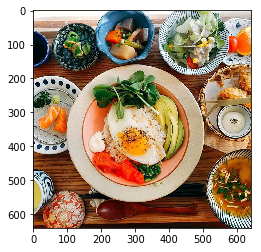

nothing


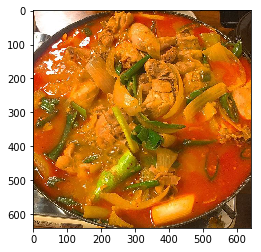

nothing


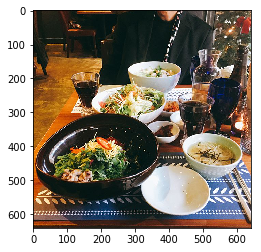

nothing


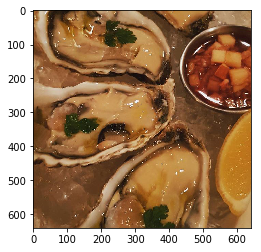

nothing


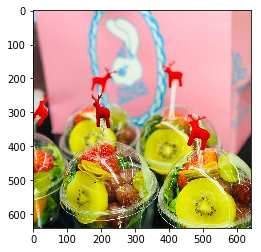

left,top,right,bottom: 189 221 261 293


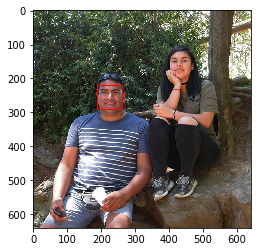

left,top,right,bottom: 397 133 469 205


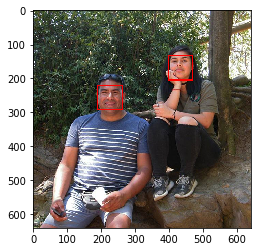

nothing


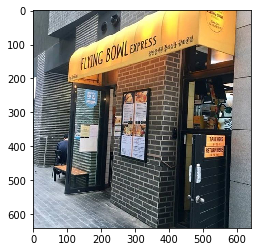

left,top,right,bottom: 231 231 355 355


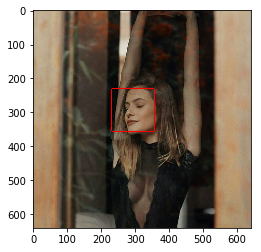

left,top,right,bottom: 198 -42 508 302


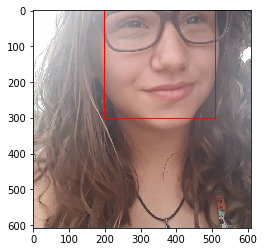

nothing


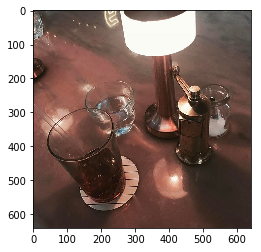

nothing


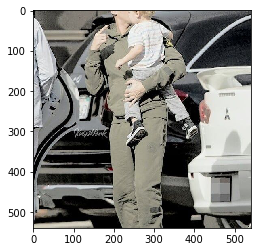

nothing


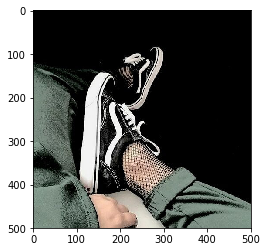

nothing


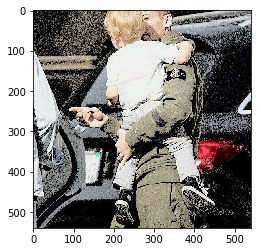

nothing


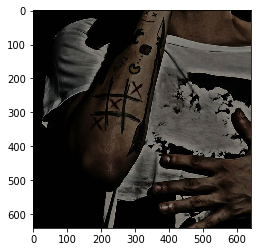

nothing


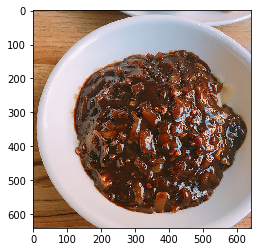

left,top,right,bottom: 325 173 397 245


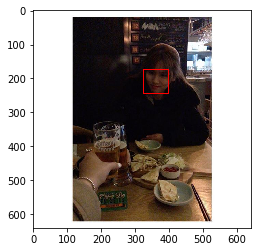

nothing


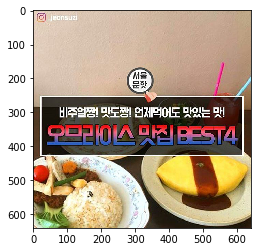

left,top,right,bottom: 526 54 630 158


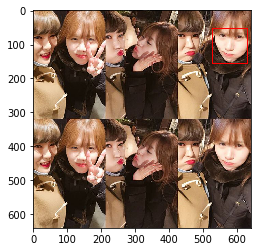

left,top,right,bottom: 100 377 204 480


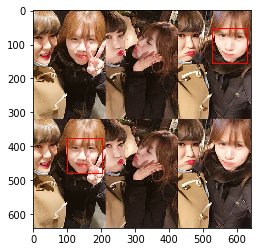

left,top,right,bottom: 526 365 630 469


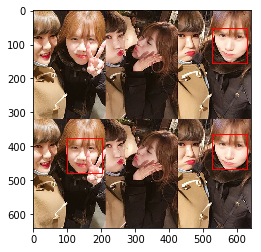

left,top,right,bottom: 102 64 189 150


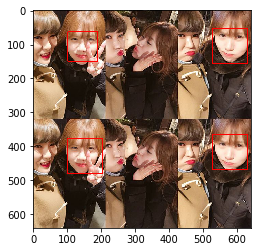

left,top,right,bottom: -27 54 89 158


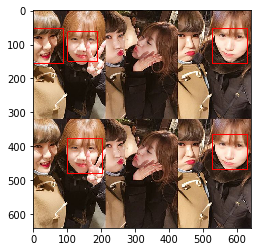

nothing


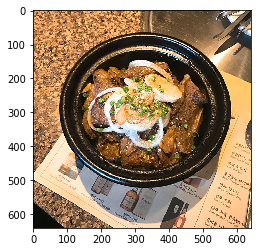

nothing


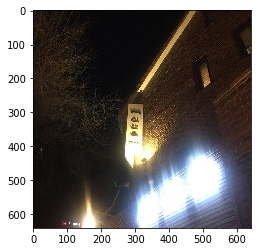

nothing


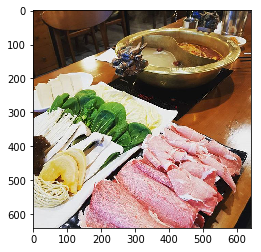

nothing


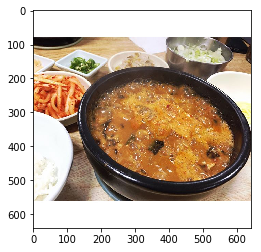

nothing


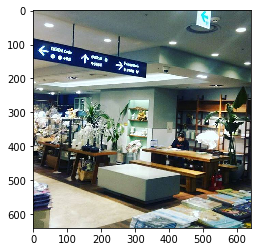

nothing


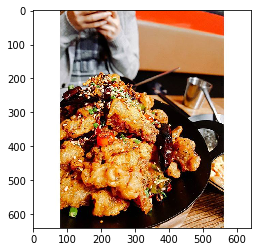

nothing


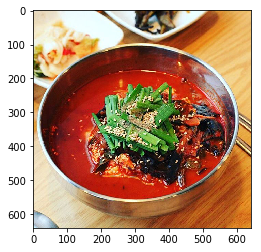

nothing


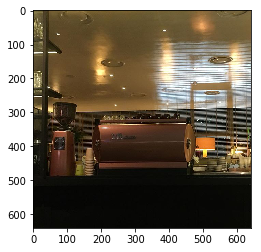

nothing


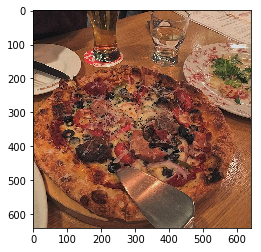

nothing


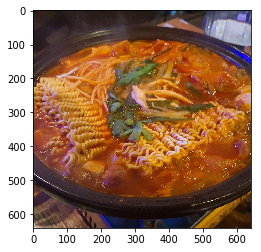

nothing


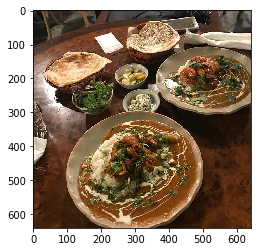

nothing


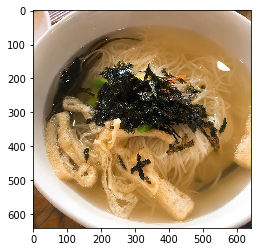

In [59]:

for image in os.listdir(imagepath):
    img = io.imread(imagepath+image)
    faces = detector(img)
    if not faces:
        print('nothing')
        plt.imshow(img)
        plt.show()
    else:
        for d in faces:
            print ("left,top,right,bottom:", d.left(), d.top(), d.right(), d.bottom())
            plt.imshow(img)
            img2=cv2.rectangle(img, (d.left(),d.top()) , (d.right(), d.bottom()), (255,0, 0), 2)
            plt.imshow(img2)
            plt.show()


# cnn face detector

In [5]:
cnn_face_detector = dlib.cnn_face_detection_model_v1('./mmod_human_face_detector.dat')
ext='.jpg'

## '광화문 맛집' 검색 시 나오는 사진들 중 얼굴이 있는 사진들 골라내기

In [6]:
imagepath = "./1_kwanghwamun_1213/category_AI/8"
savepath="/output/1"

In [7]:
detected = [] # 얼굴이 제대로 감지된 사진들 이름 저장
print(imagepath)

./1_kwanghwamun_1213/category_AI/8


47_62.jpg: Number of faces detected: 1
Detection 1: Left: 99 Top: -23 Right: 269 Bottom: 147 Confidence: 0.9593561887741089


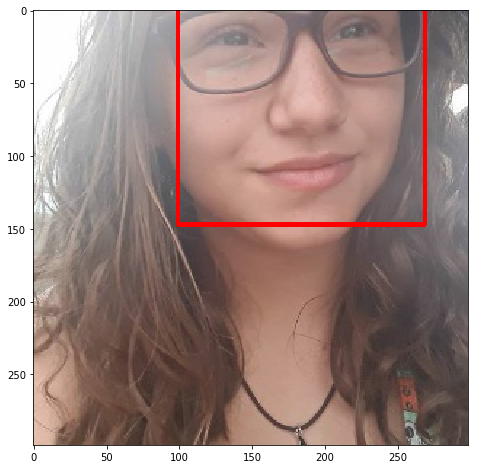

67_59.jpg: Number of faces detected: 2
Detection 1: Left: 81 Top: 101 Right: 120 Bottom: 141 Confidence: 1.064448356628418
Detection 2: Left: 181 Top: 53 Right: 220 Bottom: 93 Confidence: 0.9026991128921509


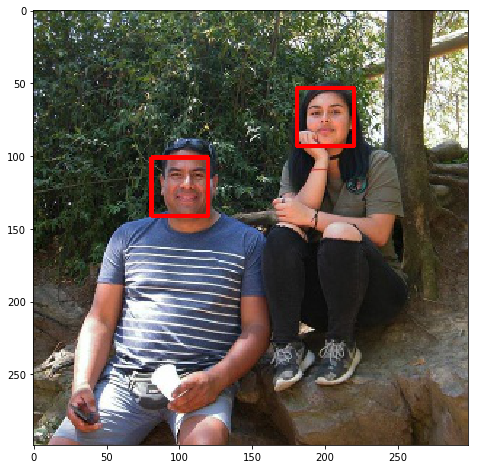

90_60.jpg: Number of faces detected: 1
Detection 1: Left: 116 Top: 116 Right: 164 Bottom: 164 Confidence: 1.0107543468475342


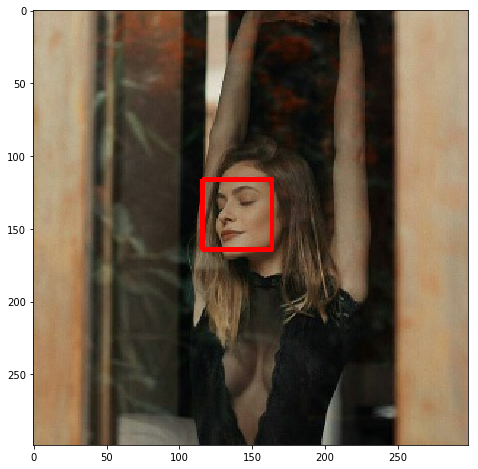

97_70.jpg: Number of faces detected: 12
Detection 1: Left: 246 Top: 164 Right: 293 Bottom: 212 Confidence: 1.073734998703003
Detection 2: Left: 133 Top: 177 Right: 172 Bottom: 217 Confidence: 1.0544506311416626
Detection 3: Left: 246 Top: 15 Right: 293 Bottom: 63 Confidence: 1.0451289415359497
Detection 4: Left: 39 Top: 169 Right: 87 Bottom: 216 Confidence: 1.0295354127883911
Detection 5: Left: 39 Top: 20 Right: 87 Bottom: 68 Confidence: 1.0232092142105103
Detection 6: Left: 87 Top: 169 Right: 135 Bottom: 216 Confidence: 1.0080769062042236
Detection 7: Left: 133 Top: 25 Right: 172 Bottom: 65 Confidence: 1.004575490951538
Detection 8: Left: 87 Top: 20 Right: 135 Bottom: 68 Confidence: 0.994016170501709
Detection 9: Left: 193 Top: 173 Right: 232 Bottom: 213 Confidence: 0.987981915473938
Detection 10: Left: 188 Top: 20 Right: 236 Bottom: 68 Confidence: 0.9064954519271851
Detection 11: Left: -9 Top: 174 Right: 39 Bottom: 221 Confidence: 0.7489637136459351
Detection 12: Left: -9 Top: 25 Rig

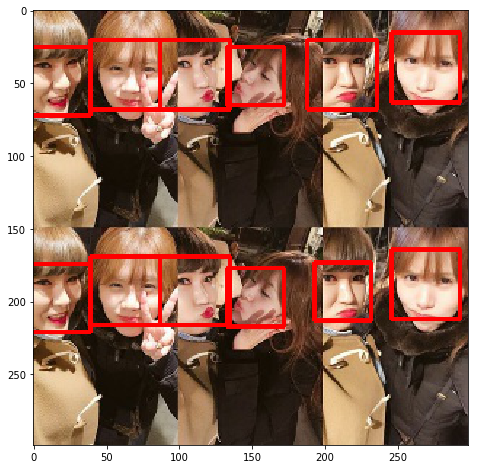

99_44.jpg: Number of faces detected: 1
Detection 1: Left: 77 Top: 88 Right: 195 Bottom: 206 Confidence: 1.0476051568984985


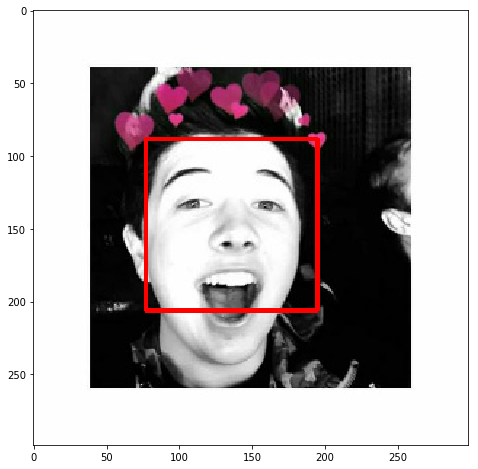

99_69.jpg: Number of faces detected: 1
Detection 1: Left: 149 Top: 69 Right: 188 Bottom: 109 Confidence: 1.0686142444610596


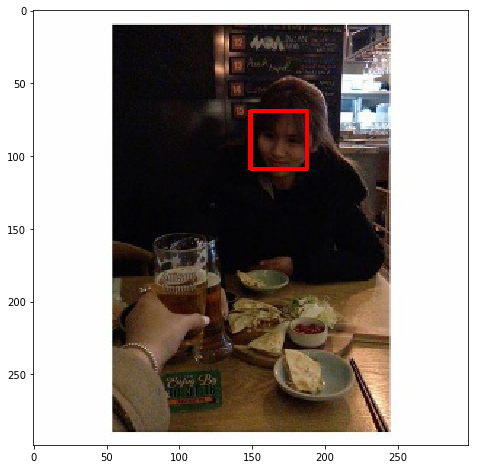

In [12]:
for image in os.listdir(imagepath):
    try:
        img = io.imread(imagepath+'/'+image)
        dets = cnn_face_detector(img,1)
        flag=False
        if(len(dets)>0):
            print(image+': Number of faces detected: {}'.format(len(dets)))
            img1 = img
        
            for j, d in enumerate(dets):
                if(d.confidence>=0.3): # 하나라도 confidence>=0.3 인 얼굴이 감지되면 저장하기
                    flag=True
                    print("Detection {}: Left: {} Top: {} Right: {} Bottom: {} Confidence: {}"
                          .format(j+1, d.rect.left(), d.rect.top(), d.rect.right(), d.rect.bottom(), d.confidence))

                    img2=cv2.rectangle(img1, (d.rect.left(),d.rect.top()) , (d.rect.right(), d.rect.bottom()), (255,0, 0), 2)                    

            if(flag==True):
                detected.append(image)
                category_path=savepath+ '/1'
                plt.figure(figsize=(12,8))
                plt.imshow(img1)
                plt.imshow(img2)
                plt.show()
            else:
                category_path=savepath+ '/0'
        else:
            category_path=savepath+ '/0'
        
        if not os.path.exists(category_path):
            os.makedirs(category_path)

        cv2.imwrite(category_path+'/'+image, convertToRGB(img))
        if(flag==True):
            cv2.imwrite(category_path+'/'+'detected'+image, convertToRGB(img2))
            
    except:
        pass


In [9]:
print(detected)

[]


## 목화솜 탕수육

In [11]:
path = "../2"
os.chdir(path)
os.getcwd()

'/Users/haewonpark/Projects/keras_talk/Team Project/Face_Detection/2'

In [ ]:
# 전부 동일한 확장자 명으로 바꿔주기
pattern = re.compile("(.JPG|.jpg)$", re.IGNORECASE) # .JPG  나 .jpg로 끝나는 패턴, ignorecase option을 붙이면 대소문자 구분없게 해주기 때문에 사실 jpg하나만 써주면 됨
for fileName in os.listdir("."):
    check = pattern.search(fileName)
    if check :
        text_to_replace = check.group()
        os.rename(fileName, fileName.replace(text_to_replace, ext))

# 이름 첫부분에 0이 하나이상 들어가는 것 바꿔주기 
pattern  = re.compile("^[0]+") # 첫부분에 0이 하나이상 반복되는 패턴
for fileName in os.listdir("."):
    check = pattern.search(fileName)
    if check :
        num_0 = check.end()
        os.rename(fileName, fileName[num_0:])

pattern = re.compile("(.png|.GIF)$",re.IGNORECASE)
for fileName in os.listdir("."):
    check=pattern.search(fileName)
    if check:
        im = Image.open(fileName)
        rgb_im = im.convert('RGB')
        rgb_im.save(fileName[:-4]+ext)
        os.remove(fileName) 

In [ ]:
detected = []

In [ ]:
for i in range(1,len(os.listdir('.'))+1):
    img = io.imread(str(i)+ext)
    try:
        dets = cnn_face_detector(img,1)
        if(len(dets)>0):
            flag=False
            print('Image'+str(i)+' Number of faces detected: {}'.format(len(dets)))
            img1 = cv2.imread(str(i)+ext)
            for j, d in enumerate(dets):
                if(d.confidence>=0.3):
                    flag=True
                print("Detection {}: Left: {} Top: {} Right: {} Bottom: {} Confidence: {}"
                      .format(j+1, d.rect.left(), d.rect.top(), d.rect.right(), d.rect.bottom(), d.confidence))
                #rects = dlib.rectangles()
                #rects.extend([d.rect for d in dets])
                cv2.rectangle(img1, (d.rect.left(),d.rect.top()) , (d.rect.right(), d.rect.bottom()), (255,0, 0), 2)
            if(flag==True):
                detected.append(i)
            plt.figure(figsize=(12,8))
            plt.imshow(convertToRGB(img1))
    except:
        pass

In [ ]:
print(detected)

# 원본 코드

In [50]:
# dets = cnn_face_detector(img, 1)
# print("Number of faces detected: {}".format(len(dets)))
# for i, d in enumerate(dets):
#     print("Detection {}: Left: {} Top: {} Right: {} Bottom: {} Confidence: {}".format(i, d.rect.left(), d.rect.top(), d.rect.right(), d.rect.bottom(), d.confidence))

# rects = dlib.rectangles()
# rects.extend([d.rect for d in dets])

# win = dlib.image_window()
# win.clear_overlay()
# win.set_image(img)
# win.add_overlay(rects)
# dlib.hit_enter_to_continue()

Number of faces detected: 2
Detection 0: Left: 232 Top: 207 Right: 526 Bottom: 500 Confidence: 1.046310544013977
Detection 1: Left: 546 Top: 114 Right: 899 Bottom: 467 Confidence: 1.0222969055175781
